## Low-level concepts comparison

In [1]:
import os
#virtually move to parent directory
os.chdir("..")

import torch
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

import utils
import data_utils
import similarity

This notebook only reproduces CLIP-Dissect, MILAN results were obtained using their repo

## Settings

In [5]:
clip_name = 'ViT-B/16'
d_probe = 'custom_domainnet'
concept_set = 'clip-dissect/concepts/20k.txt'
batch_size = 200
device = 'cuda'
pool_mode = 'max'
domain = 'real'
save_dir = 'saved_activations'
similarity_fn = similarity.soft_wpmi

In [6]:
target_name = 'plumber'
target_layers = ['layer1']
# neurons_to_display = [[1,2,3,10,12,16,24,28], [3,4]]
neurons_to_display = [list(range(0, 100, 1))]

## Run CLIP-Dissect

In [7]:
utils.save_activations(clip_name = clip_name, target_name = target_name, target_layers = target_layers, 
                       d_probe = d_probe, concept_set = concept_set, batch_size = batch_size, 
                       device = device, pool_mode=pool_mode, save_dir = save_dir, domain=domain)

with open(concept_set, 'r') as f: 
    words = (f.read()).split('\n')

pil_data = data_utils.get_data(d_probe, domain=domain)

ProjectionHead(
  (linear): Linear(in_features=512, out_features=512, bias=True)
)
Number of classes in real probe set: 345
Number of images in real probe set: 5044

Number of classes in real probe set: 345
Number of images in real probe set: 5044



100%|██████████| 26/26 [00:10<00:00,  2.56it/s]

Number of classes in real probe set: 345
Number of images in real probe set: 5044



## Conv1

In [8]:
save_names = utils.get_save_names(clip_name = clip_name, target_name = target_name,
                                  target_layer = target_layers[0], d_probe = d_probe,
                                  concept_set = concept_set, pool_mode=pool_mode,
                                  save_dir = save_dir)

target_save_name, clip_save_name, text_save_name = save_names

similarities, target_feats = utils.get_similarity_from_activations(target_save_name, clip_save_name, 
                                                                text_save_name, similarity_fn, device=device)

CLIP Image-Text similarity matrix shape: torch.Size([5044, 20000])
Target feature matrix shape: torch.Size([5044, 512])


100%|██████████| 512/512 [00:02<00:00, 223.46it/s]

Target Activation-Concept Similarity matrix shape: torch.Size([512, 20000])


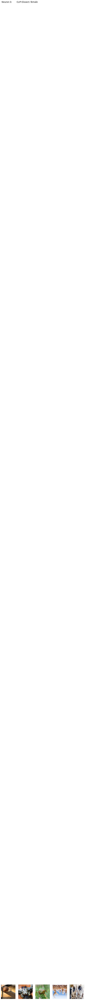

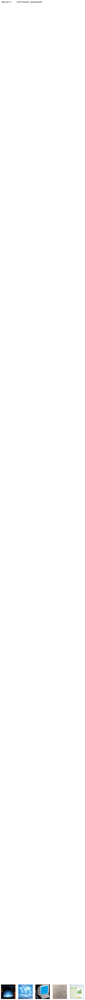

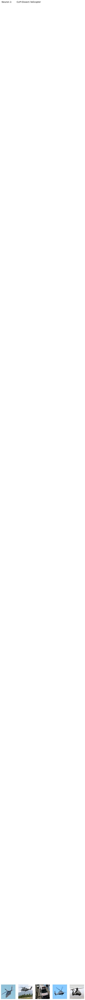

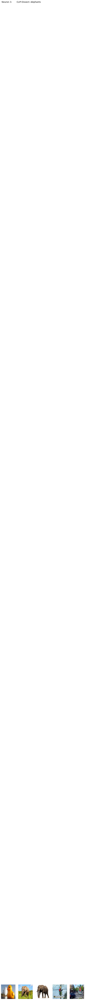

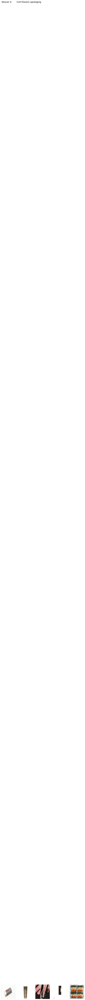

...

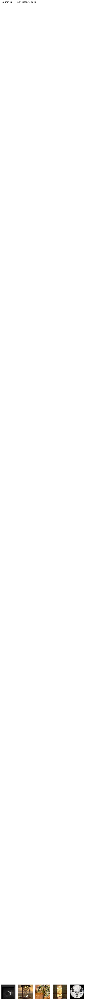

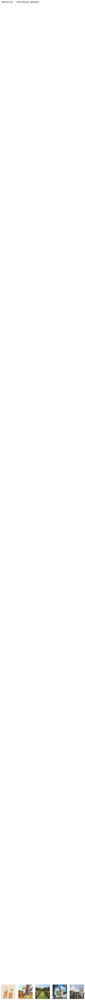

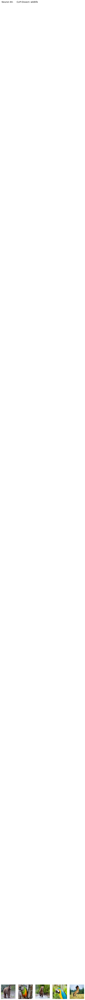

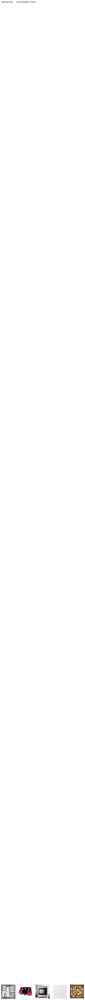

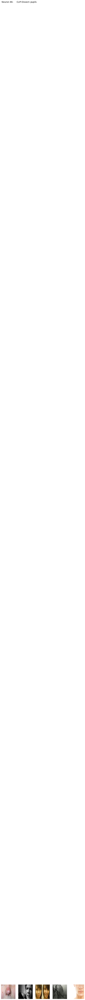

KeyboardInterrupt: 

In [9]:
top_vals, top_ids = torch.topk(target_feats, k=5, dim=0)
neurons_to_check = neurons_to_display[0]
font_size=14
font = {'size'   : font_size}

matplotlib.rc('font', **font)

for j, orig_id in enumerate(neurons_to_check):
    # Get the top k similar neurons
    vals, ids = torch.topk(similarities[orig_id], k=5, largest=True)

    # Create a figure for the current neuron
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=[10, 2])
    fig.suptitle(f"Neuron {int(orig_id)}: CLIP-Dissect: {words[int(ids[0])]}")

    # Loop through each of the top similar neurons
    for i, top_id in enumerate(top_ids[:, orig_id]):
        im, label = pil_data[top_id]
        im = im.resize([375, 375])

        # Display the image in a subplot
        axs[i].imshow(im)
        axs[i].axis('off')

    # Show the plot for the current neuron
    plt.show()

In [ ]:
domain = 'sketch'

In [ ]:
utils.save_activations(clip_name = clip_name, target_name = target_name, target_layers = target_layers, 
                       d_probe = d_probe, concept_set = concept_set, batch_size = batch_size, 
                       device = device, pool_mode=pool_mode, save_dir = save_dir, domain=domain)

with open(concept_set, 'r') as f: 
    words = (f.read()).split('\n')

pil_data = data_utils.get_data(d_probe, domain=domain)

In [ ]:
save_names = utils.get_save_names(clip_name = clip_name, target_name = target_name,
                                  target_layer = target_layers[0], d_probe = d_probe,
                                  concept_set = concept_set, pool_mode=pool_mode,
                                  save_dir = save_dir)

target_save_name, clip_save_name, text_save_name = save_names

similarities, target_feats = utils.get_similarity_from_activations(target_save_name, clip_save_name, 
                                                                text_save_name, similarity_fn, device=device)

In [ ]:
top_vals, top_ids = torch.topk(target_feats, k=5, dim=0)
neurons_to_check = neurons_to_display[0]
font_size=14
font = {'size'   : font_size}

matplotlib.rc('font', **font)

for j, orig_id in enumerate(neurons_to_check):
    # Get the top k similar neurons
    vals, ids = torch.topk(similarities[orig_id], k=5, largest=True)

    # Create a figure for the current neuron
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=[10, 2])
    fig.suptitle(f"Neuron {int(orig_id)}: CLIP-Dissect: {words[int(ids[0])]}")

    # Loop through each of the top similar neurons
    for i, top_id in enumerate(top_ids[:, orig_id]):
        im, label = pil_data[top_id]
        im = im.resize([375, 375])

        # Display the image in a subplot
        axs[i].imshow(im)
        axs[i].axis('off')

    # Show the plot for the current neuron
    plt.show()